In [1]:
#Importing the necessary libararies for the analysis
import os
import warnings
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import datetime as dt
import math
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_text

## Loading the data into the pandas dataframe

In [2]:
#reading the data using the pandas module
df=pd.read_csv("eth_1D.csv")
df=df.rename(columns={'Unnamed: 0': 'timestamp'}) #setting the timestamp as index
df=df.set_index("timestamp")

## visualization of the final target 

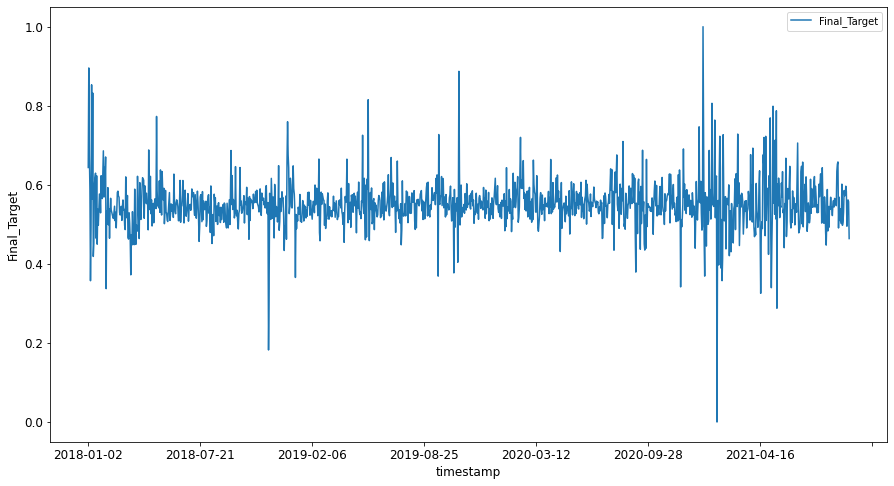

In [3]:
df.plot(y='Final_Target', subplots=True, figsize=(15, 8), fontsize=12)
plt.xlabel('timestamp', fontsize=12)
plt.ylabel('Final_Target', fontsize=12)
plt.show()

In [4]:
# univariate data: Final_Target vs Time

uni_data_df = df['Final_Target']
uni_data_df.head()
uni_data_df.shape

(1360,)

In [5]:
uni_data_df.shape

(1360,)

In [6]:
train_start_dt = '2018-01-02'
test_start_dt = '2020-08-11'

## Data visualisation of train and test 

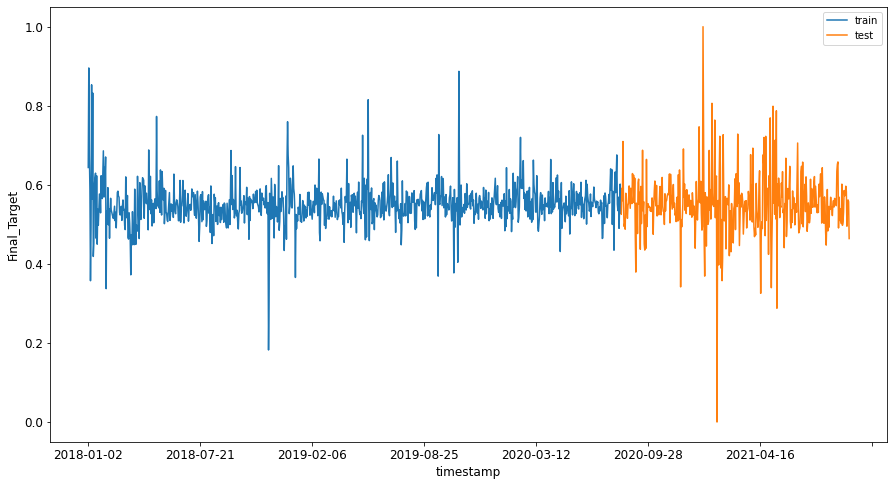

In [7]:
df[(df.index < test_start_dt) & (df.index >= train_start_dt)][['Final_Target']].rename(columns={'Final_Target':'train'}) \
    .join(df[test_start_dt:][['Final_Target']].rename(columns={'Final_Target':'test'}), how='outer') \
    .plot(y=['train', 'test'], figsize=(15, 8), fontsize=12)
plt.xlabel('timestamp', fontsize=12)
plt.ylabel('Final_Target', fontsize=12)
plt.show()

In [8]:
train = df.copy()[(df.index >= train_start_dt) & (df.index < test_start_dt)][['Final_Target']]
test = df.copy()[df.index >= test_start_dt][['Final_Target']]

print('Training data shape: ', train.shape)
print('Test data shape: ', test.shape)

Training data shape:  (952, 1)
Test data shape:  (408, 1)


In [9]:
train.head(10)

,Final_Target
timestamp,
2018-01-02,0.643898
2018-01-03,0.895602
2018-01-04,0.674273
2018-01-05,0.587664
2018-01-06,0.357411
2018-01-07,0.492080
2018-01-08,0.853036
2018-01-09,0.564154
2018-01-10,0.832306


In [10]:
test.shape

(408, 1)

In [11]:
test.head(10)

,Final_Target
timestamp,
2020-08-11,0.525519
2020-08-12,0.591232
2020-08-13,0.559901
2020-08-14,0.709653
2020-08-15,0.549529
2020-08-16,0.494884
2020-08-17,0.501992
2020-08-18,0.487731
2020-08-19,0.578665


In [12]:
# Converting to numpy arrays
train_data = train.values
test_data = test.values

In [13]:
#using the previous past 4 time steps to predict the next time step i.e 5th min target value
timesteps=5

In [14]:
train_data_timesteps=np.array([[j for j in train_data[i:i+timesteps]] for i in range(0,len(train_data)-timesteps+1)])[:,:,0]
train_data_timesteps.shape

(948, 5)

In [15]:
train_data_timesteps

array([[0.6438976 , 0.89560173, 0.67427336, 0.58766381, 0.35741104],
       [0.89560173, 0.67427336, 0.58766381, 0.35741104, 0.49208042],
       [0.67427336, 0.58766381, 0.35741104, 0.49208042, 0.85303592],
       ...,
       [0.55111854, 0.53464108, 0.56860834, 0.48989827, 0.53837988],
       [0.53464108, 0.56860834, 0.48989827, 0.53837988, 0.60186585],
       [0.56860834, 0.48989827, 0.53837988, 0.60186585, 0.52852349]])

In [16]:
test_data_timesteps=np.array([[j for j in test_data[i:i+timesteps]] for i in range(0,len(test_data)-timesteps+1)])[:,:,0]
test_data_timesteps.shape

(404, 5)

In [17]:
test_data_timesteps

array([[0.52551917, 0.59123209, 0.559901  , 0.70965285, 0.54952946],
       [0.59123209, 0.559901  , 0.70965285, 0.54952946, 0.49488413],
       [0.559901  , 0.70965285, 0.54952946, 0.49488413, 0.50199193],
       ...,
       [0.59656814, 0.58310972, 0.49532802, 0.54084929, 0.56185012],
       [0.58310972, 0.49532802, 0.54084929, 0.56185012, 0.55717008],
       [0.49532802, 0.54084929, 0.56185012, 0.55717008, 0.46407055]])

In [18]:
x_train, y_train = train_data_timesteps[:,:timesteps-1],train_data_timesteps[:,[timesteps-1]]
x_test, y_test = test_data_timesteps[:,:timesteps-1],test_data_timesteps[:,[timesteps-1]]

print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

(948, 4) (948, 1)
(404, 4) (404, 1)


In [19]:
x_train,y_train

(array([[0.6438976 , 0.89560173, 0.67427336, 0.58766381],
        [0.89560173, 0.67427336, 0.58766381, 0.35741104],
        [0.67427336, 0.58766381, 0.35741104, 0.49208042],
        ...,
        [0.55111854, 0.53464108, 0.56860834, 0.48989827],
        [0.53464108, 0.56860834, 0.48989827, 0.53837988],
        [0.56860834, 0.48989827, 0.53837988, 0.60186585]]),
 array([[0.35741104],
        [0.49208042],
        [0.85303592],
        [0.56415416],
        [0.83230641],
        [0.41885073],
        [0.45237046],
        [0.59956653],
        [0.6180436 ],
        [0.62952654],
        [0.4649851 ],
        [0.62288243],
        [0.44987078],
        [0.53825222],
        [0.49785711],
        [0.53451967],
        [0.5767268 ],
        [0.57509974],
        [0.52911069],
        [0.62302001],
        [0.56892121],
        [0.56527228],
        [0.62911961],
        [0.68601766],
        [0.56902598],
        [0.64391276],
        [0.61376116],
        [0.67045604],
        [0.33734643],

In [20]:
x_test, y_test

(array([[0.52551917, 0.59123209, 0.559901  , 0.70965285],
        [0.59123209, 0.559901  , 0.70965285, 0.54952946],
        [0.559901  , 0.70965285, 0.54952946, 0.49488413],
        ...,
        [0.59656814, 0.58310972, 0.49532802, 0.54084929],
        [0.58310972, 0.49532802, 0.54084929, 0.56185012],
        [0.49532802, 0.54084929, 0.56185012, 0.55717008]]),
 array([[0.54952946],
        [0.49488413],
        [0.50199193],
        [0.48773059],
        [0.57866486],
        [0.57241112],
        [0.53265718],
        [0.51523144],
        [0.54792786],
        [0.55463368],
        [0.59723388],
        [0.56683646],
        [0.54061806],
        [0.59154753],
        [0.56933108],
        [0.5525001 ],
        [0.62851255],
        [0.59822126],
        [0.62426842],
        [0.55475512],
        [0.61675009],
        [0.47316437],
        [0.37928207],
        [0.55359187],
        [0.5452862 ],
        [0.4767165 ],
        [0.60516385],
        [0.61449676],
        [0.550711  ],

## Model training

In [21]:
# Train the model
model = DecisionTreeRegressor().fit(x_train, y_train)
print (model, "\n")

# Visualize the model tree
tree = export_text(model)
print(tree)

DecisionTreeRegressor() 

|--- feature_3 <= 0.26
|   |--- value: [0.34]
|--- feature_3 >  0.26
|   |--- feature_1 <= 0.84
|   |   |--- feature_2 <= 0.84
|   |   |   |--- feature_1 <= 0.54
|   |   |   |   |--- feature_2 <= 0.45
|   |   |   |   |   |--- feature_2 <= 0.35
|   |   |   |   |   |   |--- value: [0.53]
|   |   |   |   |   |--- feature_2 >  0.35
|   |   |   |   |   |   |--- feature_3 <= 0.48
|   |   |   |   |   |   |   |--- value: [0.45]
|   |   |   |   |   |   |--- feature_3 >  0.48
|   |   |   |   |   |   |   |--- feature_1 <= 0.50
|   |   |   |   |   |   |   |   |--- feature_2 <= 0.45
|   |   |   |   |   |   |   |   |   |--- value: [0.49]
|   |   |   |   |   |   |   |   |--- feature_2 >  0.45
|   |   |   |   |   |   |   |   |   |--- feature_3 <= 0.54
|   |   |   |   |   |   |   |   |   |   |--- value: [0.48]
|   |   |   |   |   |   |   |   |   |--- feature_3 >  0.54
|   |   |   |   |   |   |   |   |   |   |--- value: [0.48]
|   |   |   |   |   |   |   |--- feature_1 >  0.50


In [22]:
model.fit(x_train, y_train[:,0])

DecisionTreeRegressor()

In [23]:
y_train_pred = model.predict(x_train).reshape(-1,1)
y_test_pred = model.predict(x_test).reshape(-1,1)

print(y_train_pred.shape, y_test_pred.shape)

(948, 1) (404, 1)


In [24]:
train_timestamps = df[(df.index < test_start_dt) & (df.index >= train_start_dt)].index[timesteps-1:]
test_timestamps = df[test_start_dt:].index[timesteps-1:]

print(len(train_timestamps), len(test_timestamps))

948 404


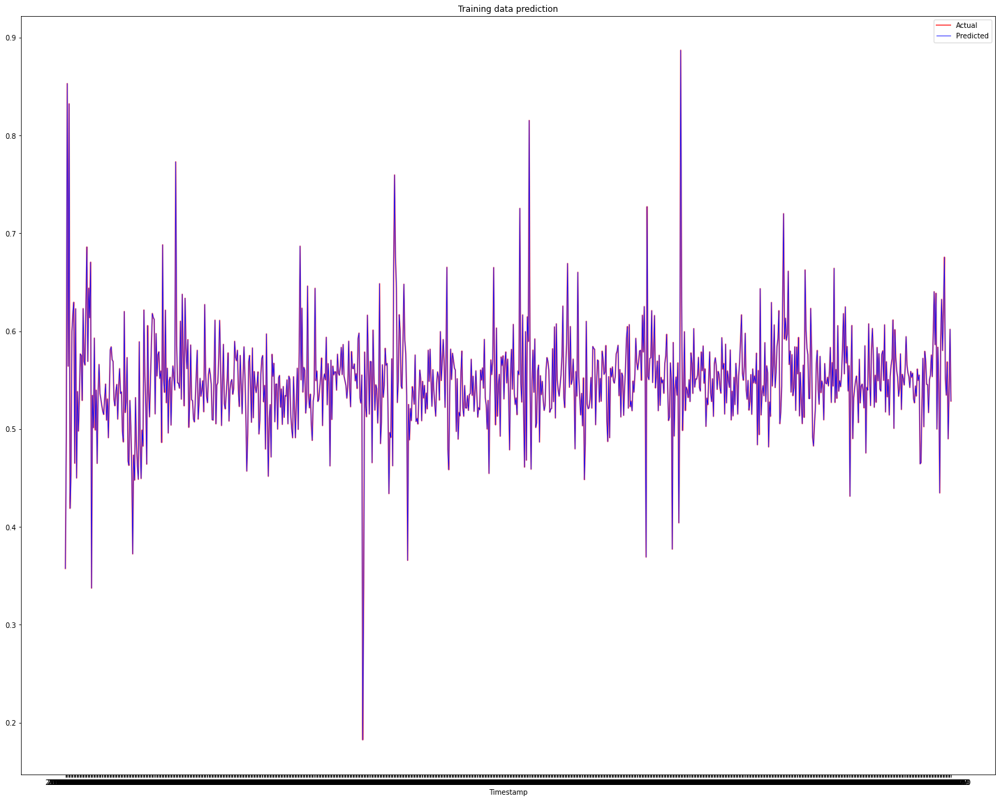

In [25]:
plt.figure(figsize=(25,20))
plt.plot(train_timestamps[:], y_train, color = 'red', linewidth=2.0, alpha = 0.6)
plt.plot(train_timestamps[:], y_train_pred, color = 'blue', linewidth=0.8)
plt.legend(['Actual','Predicted'])
plt.xlabel('Timestamp')
plt.title("Training data prediction")
plt.show()

In [26]:
#https://www.codegrepper.com/code-examples/python/mean+absolute+percentage+error+in+python
def percentage_error(actual, predicted):
    res = np.empty(actual.shape)
    for j in range(actual.shape[0]):
        if actual[j] != 0:
            res[j] = (actual[j] - predicted[j]) / actual[j]
        else:
            res[j] = predicted[j] / np.mean(actual)
    return res

def mean_absolute_percentage_error1(y_true, y_pred): 
    return np.mean(np.abs(percentage_error(np.asarray(y_true), np.asarray(y_pred)))) * 100

In [27]:
mean_absolute_percentage_error1(y_test,y_test_pred)

12.391158329757511

In [28]:
mean_absolute_percentage_error1(y_train,y_train_pred)

0.0

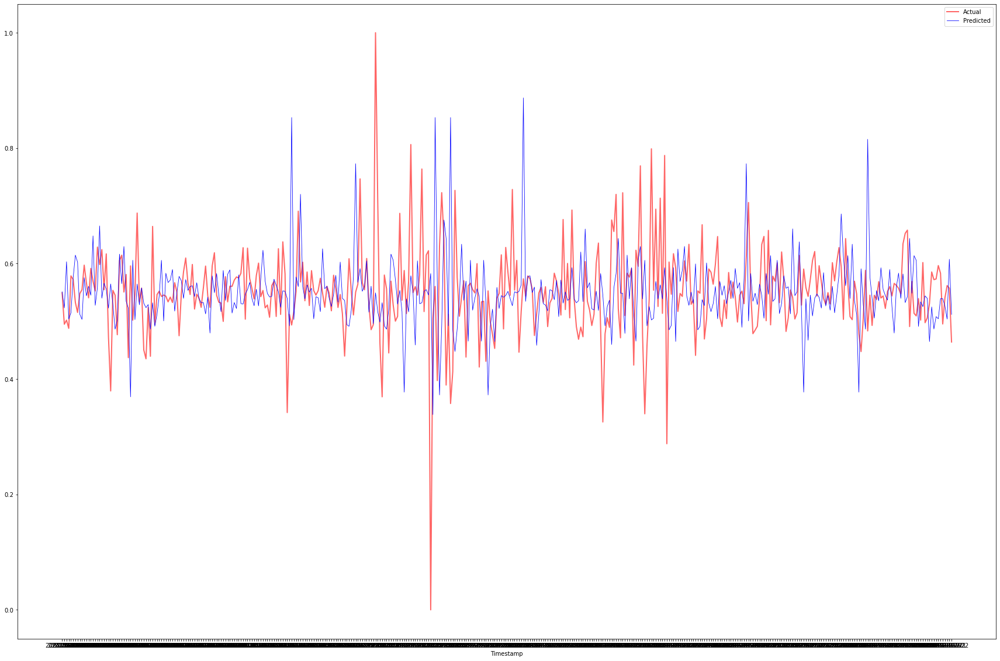

In [29]:
plt.figure(figsize=(30,20))
plt.plot(test_timestamps, y_test, color = 'red', linewidth=2.0, alpha = 0.6)
plt.plot(test_timestamps, y_test_pred, color = 'blue', linewidth=0.8)
plt.legend(['Actual','Predicted'])
plt.xlabel('Timestamp')
plt.show()

## Hyperparameter tuning

In [30]:
# Hyper parameters range intialization for tuning 

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11,13],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90] }

In [32]:
# calculating different regression metrics

from sklearn.model_selection import GridSearchCV

tuning_model=GridSearchCV(model,param_grid=parameters,scoring='neg_mean_absolute_percentage_error',cv=3,verbose=3)

tuning_model.fit(X_train,y_train)

Fitting 3 folds for each of 50400 candidates, totalling 151200 fits
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-0.068 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-0.067 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=best;, score=-0.052 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-0.067 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_leaf=0.1, splitter=random;, score=-0.067 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1, min_weight_fraction_le

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [35]:
tuning_model.best_params_

{'max_depth': 11,
 'max_features': 'sqrt',
 'max_leaf_nodes': 80,
 'min_samples_leaf': 8,
 'min_weight_fraction_leaf': 0.3,
 'splitter': 'best'}

In [36]:
tuned_hyper_model= DecisionTreeRegressor(max_depth=11,max_features='sqrt',max_leaf_nodes=80,min_samples_leaf=8,min_weight_fraction_leaf=0.3,splitter='best')

tuned_hyper_model.fit(x_train,y_train)

DecisionTreeRegressor(max_depth=11, max_features='sqrt', max_leaf_nodes=80,
                      min_samples_leaf=8, min_weight_fraction_leaf=0.3)

In [37]:
tuned_hyper_model.fit(x_train, y_train[:,0])

DecisionTreeRegressor(max_depth=11, max_features='sqrt', max_leaf_nodes=80,
                      min_samples_leaf=8, min_weight_fraction_leaf=0.3)

In [38]:
y_train_pred1 = tuned_hyper_model.predict(x_train).reshape(-1,1)
y_test_pred1 = tuned_hyper_model.predict(x_test).reshape(-1,1)

print(y_train_pred1.shape, y_test_pred1.shape)

(948, 1) (404, 1)


In [41]:
train_timestamps1 = df[(df.index < test_start_dt) & (df.index >= train_start_dt)].index[timesteps-1:]
test_timestamps1 = df[test_start_dt:].index[timesteps-1:]

print(len(train_timestamps1), len(test_timestamps1))

948 404


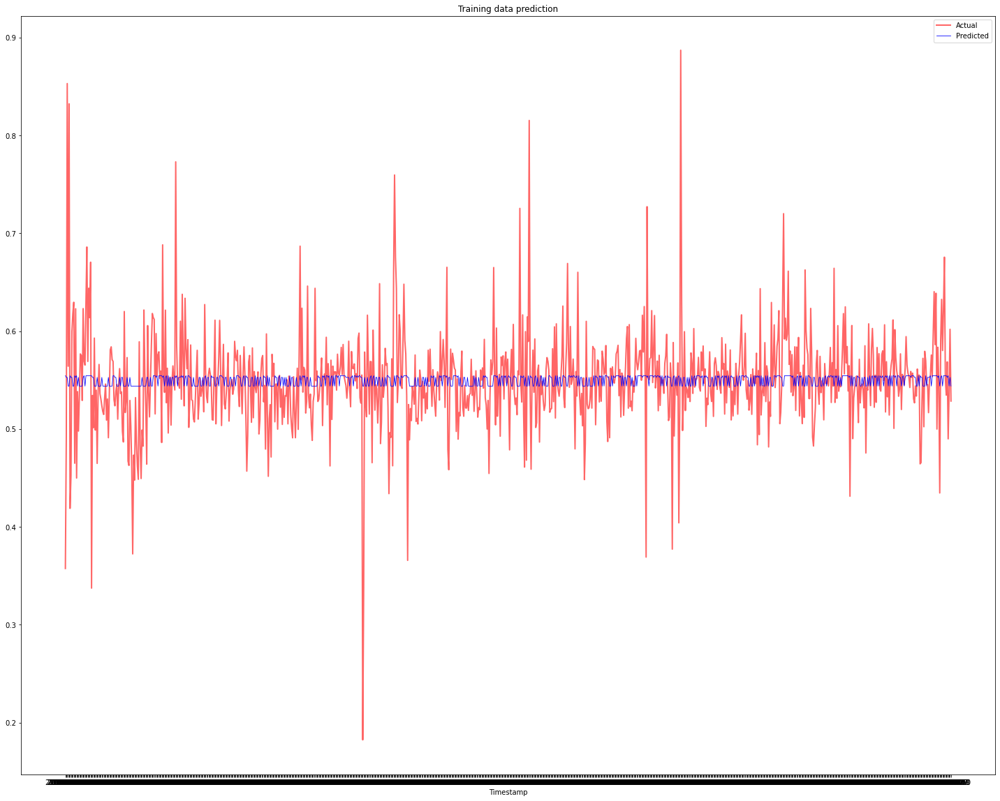

In [44]:
plt.figure(figsize=(25,20))
plt.plot(train_timestamps1[:], y_train, color = 'red', linewidth=2.0, alpha = 0.6)
plt.plot(train_timestamps1[:], y_train_pred1, color = 'blue', linewidth=0.8)
plt.legend(['Actual','Predicted'])
plt.xlabel('Timestamp')
plt.title("Training data prediction")
plt.show()

In [45]:
# Test MAPE
mean_absolute_percentage_error1(y_test,y_test_pred1)

9.273752475991534

In [46]:
# Train MAPE
mean_absolute_percentage_error1(y_train,y_train_pred1)

6.139658230631866

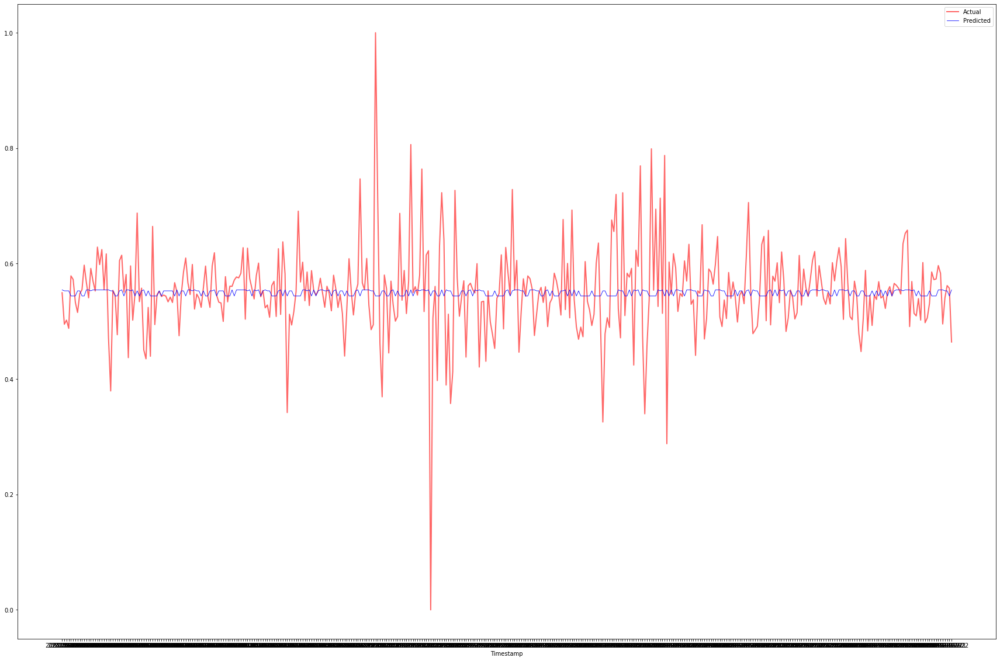

In [47]:
plt.figure(figsize=(30,20))
plt.plot(test_timestamps, y_test, color = 'red', linewidth=2.0, alpha = 0.6)
plt.plot(test_timestamps, y_test_pred1, color = 'blue', linewidth=0.8)
plt.legend(['Actual','Predicted'])
plt.xlabel('Timestamp')
plt.show()

In [48]:
print('MSE:', mean_squared_error(y_test, y_test_pred1))
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_test_pred1)))

MSE: 0.005954688348173439
RMSE: 0.0771666271659805


In [49]:
print('MSE:', mean_squared_error(y_train, y_train_pred1))
print('RMSE:', np.sqrt(mean_squared_error(y_train, y_train_pred1)))

MSE: 0.002480771169584843
RMSE: 0.049807340519092594
